In [1]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

pd.set_option('mode.chained_assignment', None)

In [2]:
data = pd.read_csv("data/test/Goblin_SingleQLAI_Goblin1_1.csv")
print("Num rows: ", len(data))
print("Cols: ", data.keys())
data.head()

Num rows:  6353
Cols:  Index(['pos_x_diff', 'pos_y_diff', 'enemy_dist', 'self_life', 'enemy_life',
       'enemy_attacking', 'enemy_dir_x', 'enemy_dir_y', 'q_val', 'reward',
       'next_val', 'priority', 'exploration_rate', 'learning_rate',
       'experience_size', 'time', 'exp_id', 'purpuse', 'terminal', 'idle_q',
       'attack_q', 'walk_right_q', 'walk_up_right_q', 'walk_up_q',
       'walk_up_left_q', 'walk_left_q', 'walk_down_left_q', 'walk_down_q',
       'walk_down_right_q'],
      dtype='object')


,pos_x_diff,pos_y_diff,enemy_dist,self_life,enemy_life,enemy_attacking,enemy_dir_x,enemy_dir_y,q_val,reward,...,idle_q,attack_q,walk_right_q,walk_up_right_q,walk_up_q,walk_up_left_q,walk_left_q,walk_down_left_q,walk_down_q,walk_down_right_q
0,0.022449,-0.026787,0.034951,1.0,1.0,-1.0,1.192500e-08,1.0,-0.004108,0.0,...,-0.004108,-0.004108,-0.004327,-0.004641,-0.004637,-0.004321,-0.003883,-0.003575,-0.003574,-0.003883
1,0.022449,-0.026787,0.034951,1.0,1.0,-1.0,1.192500e-08,1.0,-0.004108,0.0,...,0.000443,0.000443,0.000141,-0.000085,0.000003,0.000349,0.000749,0.000972,0.000890,0.000547
2,0.036700,-0.026787,0.045436,1.0,1.0,-1.0,1.192500e-08,1.0,0.000443,0.0,...,-0.006051,-0.006051,-0.006423,-0.006534,-0.006358,-0.006003,-0.005678,-0.005566,-0.005735,-0.006090
3,0.036700,-0.012537,0.038782,1.0,1.0,-1.0,1.192500e-08,1.0,-0.006051,0.0,...,-0.451355,-0.451355,-0.451784,-0.451892,-0.451681,-0.451280,-0.450924,-0.450817,-0.451020,-0.451421
4,0.039651,-0.019662,0.044258,1.0,1.0,-1.0,1.000000e+00,0.0,-0.451355,0.0,...,-0.440025,-0.440025,-0.440388,-0.440590,-0.440457,-0.440071,-0.439659,-0.439459,-0.439587,-0.439971


In [4]:
eps = 1e-6

third = 1.0 / 3.0
half = 1.0 / 2.0
reward_table = {
    - 1.0: "(dead, -)",
    - half: "(2 -> 1, 0)",
    - third: "(3 -> 2, 0)",
    third - half: "(2 -> 1, 3 -> 2)",
    0.0: "(-, -)",
    half - third: "(3 -> 2, 2 -> 1)",
    third: "(0, 3 -> 2)",
    half: "(2 -> 1, 0)",
    1.0: "(-, dead)"
}
reward_bins = [reward_table[key] for key in sorted(reward_table.keys())]
def get_reward_bin(reward):
    for k, v in reward_table.items():
        if reward <= k + eps and reward >= k - eps:
            return v
    if abs(reward) <= third + eps:
        return "medium"
    if reward > third:
        return "high"
    return "low"

life_bins = ["0.0", "(0.0 -> 0.333]", "(0.333, 0.666]", "(0.666 -> 1.0]"]
def get_life_bin(life):
    if life == 0.0:
        return life_bins[0]
    b = int(np.floor(3 * (life - eps))) + 1
    return life_bins[b]

discount = 0.999

q_vals = data.filter(regex="_q$")
data["q_avg"] = q_vals.mean(axis=1)
data["q_std"] = q_vals.std(axis=1)

data["label"] = data["reward"] + discount * data["next_val"] * (~ data["terminal"])
data["loss"] = (data["label"] - data["q_val"])**2
data["reward_bin"] = data["reward"].map(get_reward_bin)
data["self_life_bin"] = data["self_life"].map(get_life_bin)
data["enemy_life_bin"] = data["enemy_life"].map(get_life_bin)

replay_data = data[data["purpuse"] == "replay"]
real_time_data = data[data["purpuse"] == "update"]
test_data = data[data["purpuse"] == "test"]

replay_times = sorted(replay_data["time"].value_counts().keys().tolist())
max_time = max(data["time"]) + 0.1

print("Max time: ", max_time)
print()
print(data["replay"].value_counts())
print()
print(data[["q_avg", "q_std"]].head())
print()
print(data.describe())

Max time:  190.100002831221



KeyError: 'replay'

In [6]:
def plot_replay_lines(df, y_var):
    max_val = max(df[y_var])
    min_val = min(df[y_var])
    lines = []
    for time in replay_times:
        lines.append([time, time])
        lines.append([min_val, max_val])
    plt.plot(*lines, linestyle=":", color="green")
    
def separate_outliers(df, var, c=1.5):
    quantiles = df[var].quantile([0.25, 0.75])
    iq_height = quantiles[0.75] - quantiles[0.25]
    outliers_range = [quantiles[0.25] - c * iq_height, quantiles[0.75] + c * iq_height]
    outliers = df[(df[var] < outliers_range[0]) | (df[var] > outliers_range[1])]
    not_outliers = df[(df[var] >= outliers_range[0]) & (df[var] <= outliers_range[1])]
    return not_outliers, outliers

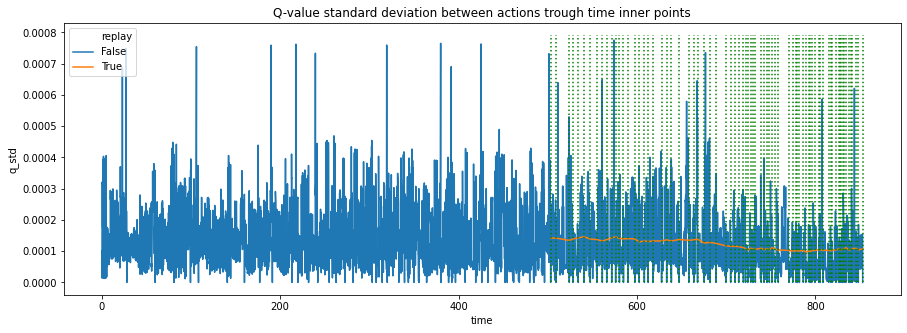

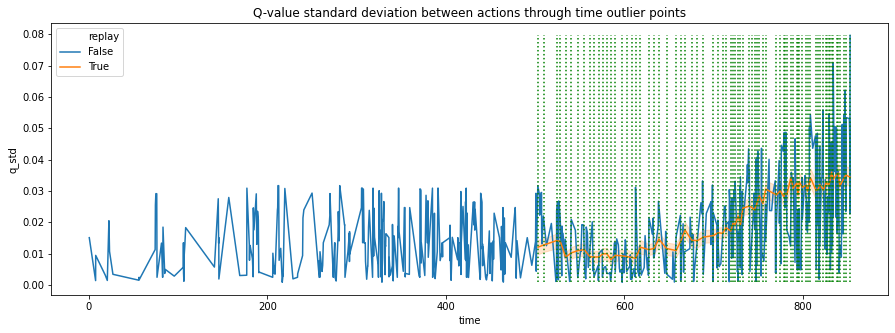

In [17]:
time_q_std = data[["time", "q_std", "replay"]]
c = 4.0

not_outliers, outliers = separate_outliers(time_q_std, "q_std", c=c)

plt.figure(figsize=(15, 5))
plt.title("Q-value standard deviation between actions trough time inner points")
sns.lineplot(x="time", y="q_std", hue="replay", data=not_outliers)
plot_replay_lines(not_outliers, "q_std")
plt.show()

if len(outliers) > 1:
    plt.figure(figsize=(15, 5))
    plt.title("Q-value standard deviation between actions through time outlier points")
    sns.lineplot(x="time", y="q_std", hue="replay", data=outliers)
    plot_replay_lines(outliers, "q_std")
    plt.show()
else:
    print("No outliers")

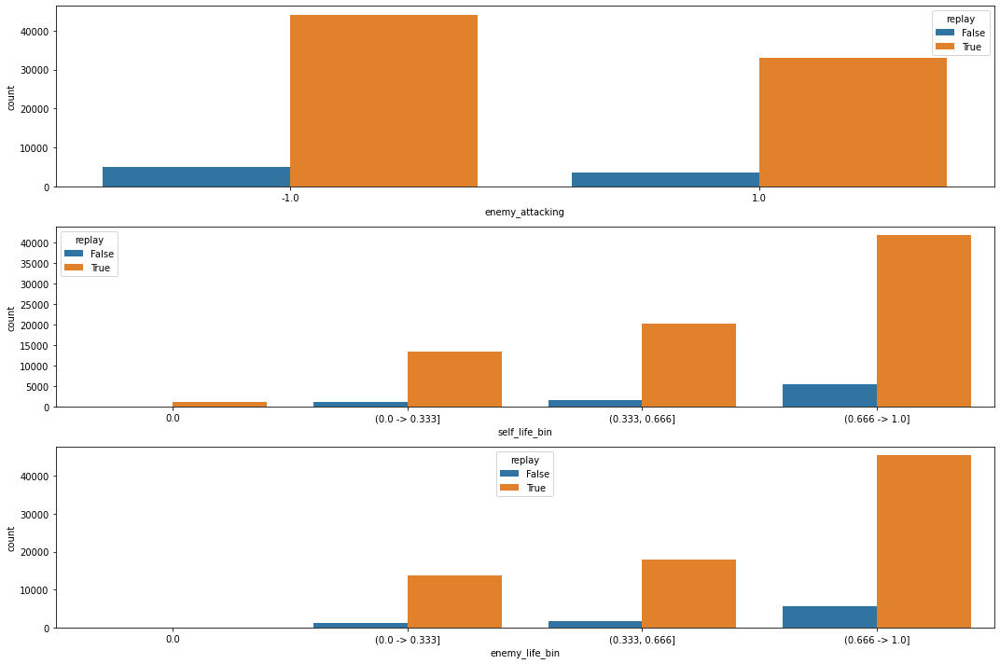

In [8]:
rows = {
    'enemy_attacking': None,
    'self_life_bin': life_bins,
    'enemy_life_bin': life_bins
}

fig, ax = plt.subplots(len(rows), 1, figsize=(15, 10))
for i, (key, order) in enumerate(rows.items()):
    sns.countplot(x=key, hue="replay", order=order, data=data, ax=ax[i])
plt.tight_layout()
plt.show()

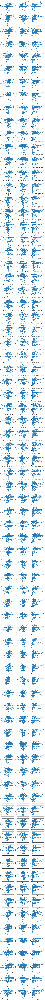

In [9]:
cols = ['pos_x_diff', 'pos_y_diff', 'enemy_dist']

fig, ax = plt.subplots(len(replay_times), len(cols), figsize=(15, 4.25 * len(replay_times)))
for i in range(len(replay_times)):
    time_data = replay_data[replay_data["time"] == replay_times[i]]
    for j in range(len(cols)):
        sns.regplot(x=cols[j], y="q_avg", data=time_data, ax=ax[i][j])
plt.tight_layout()
plt.show()

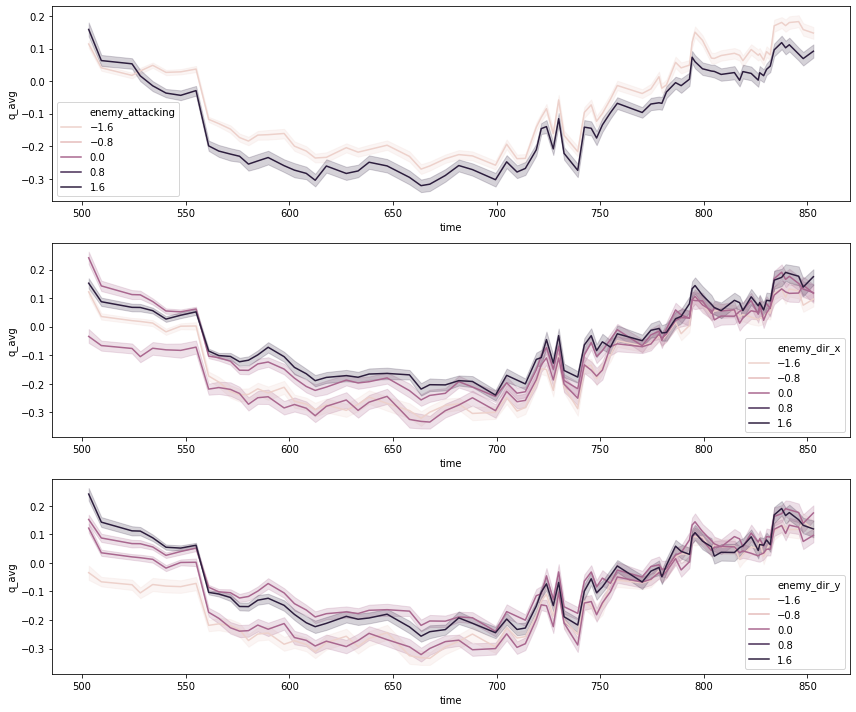

In [10]:
rows = ['enemy_attacking', 'enemy_dir_x', 'enemy_dir_y']

fig, ax = plt.subplots(len(rows), 1, figsize=(12, 10))
for i in range(len(rows)):
    sns.lineplot(x="time", y="q_avg", hue=rows[i], data=replay_data, ax=ax[i])
plt.tight_layout()
plt.show()

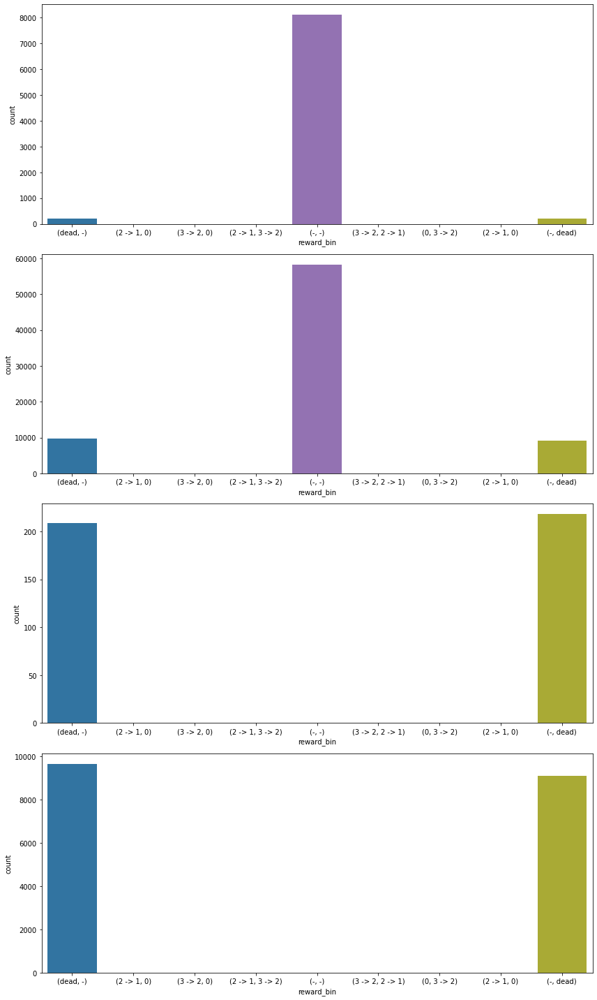

In [11]:
fig, ax = plt.subplots(4, 1, figsize=(12, 20))
sns.countplot(x="reward_bin", data=real_time_data, order=reward_bins, ax=ax[0])
sns.countplot(x="reward_bin", data=replay_data, order=reward_bins, ax=ax[1])
sns.countplot(x="reward_bin", data=real_time_data[real_time_data["reward_bin"] != "(-, -)"], order=reward_bins, ax=ax[2])
sns.countplot(x="reward_bin", data=replay_data[replay_data["reward_bin"] != "(-, -)"], order=reward_bins, ax=ax[3])
plt.tight_layout()
plt.show()

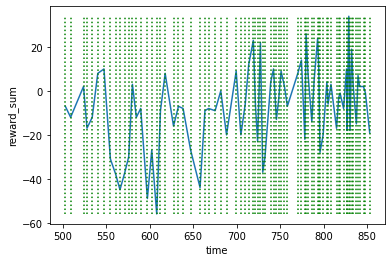

In [12]:
# Group rewards by time and accumulate them
reward_time = replay_data.groupby(by="time")["reward"].sum().to_frame("reward_sum").reset_index()
# Plot the graph
sns.lineplot(x="time", y="reward_sum", data=reward_time)

plot_replay_lines(reward_time, "reward_sum")
plt.show()

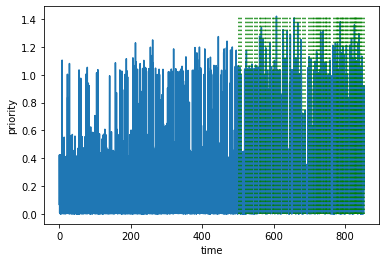

In [13]:
sns.lineplot(x="time", y="priority", data=real_time_data)

plot_replay_lines(real_time_data, "priority")
plt.show()

In [14]:
terminal_priority = data[["terminal", "priority"]]
print(terminal_priority[terminal_priority["terminal"] == False].describe())
print(terminal_priority[terminal_priority["terminal"] == True].describe())

           priority
count  80858.000000
mean       0.386805
std        0.345937
min        0.000033
25%        0.116431
50%        0.296795
75%        0.528993
max        1.485316
          priority
count  4671.000000
mean      0.899010
std       0.228589
min       0.316642
25%       0.724441
50%       0.877204
75%       1.060561
max       1.437062


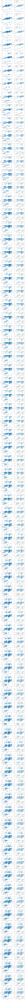

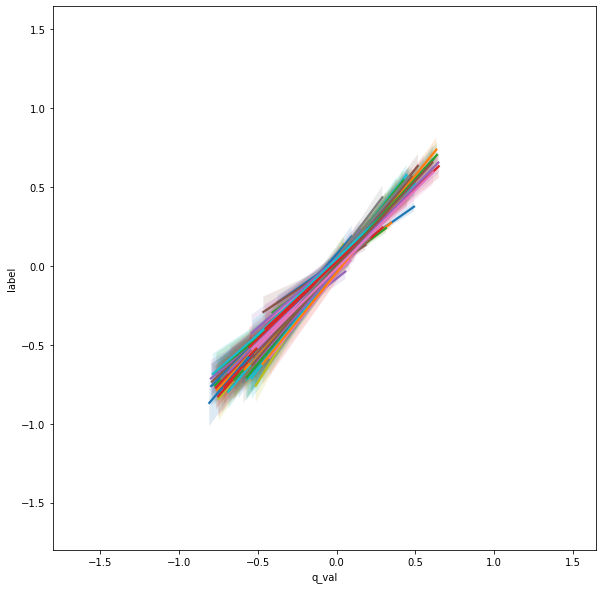

In [15]:
# Relation between q_val and label through time
fig, ax = plt.subplots(len(replay_times), 2, figsize=(8, 4 * len(replay_times)))
for i in range(len(replay_times)):
    this_time_data = replay_data[replay_data["time"] == replay_times[i]]
    sns.regplot(x="q_val", y="label", data=this_time_data, ax=ax[i][0])
    sns.scatterplot(x="q_val", y="label", hue="terminal", data=this_time_data, ax=ax[i][1])
plt.tight_layout()
plt.show()

axis_max = max([max(replay_data["label"]), max(replay_data["q_val"])])
axis_min = min([min(replay_data["label"]), min(replay_data["q_val"])])

# Regression lines plotted side by side
plt.figure(figsize=(10, 10))
for i in range(len(replay_times)):
    sns.regplot(x="q_val", y="label", data=replay_data[replay_data["time"] == replay_times[i]], scatter=False)
plt.xlim(axis_min, axis_max)
plt.ylim(axis_min, axis_max)
plt.gca().set_aspect('equal', adjustable='box')
plt.show()
# Primeira linha é a azul escura

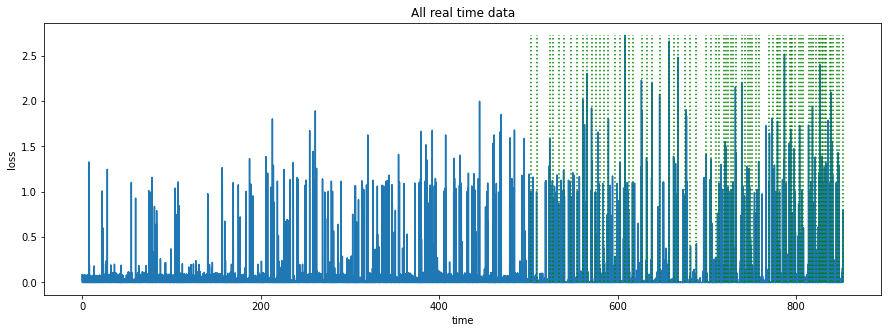

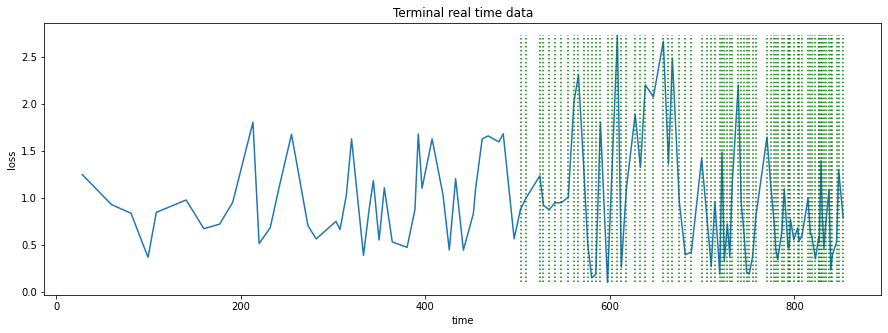

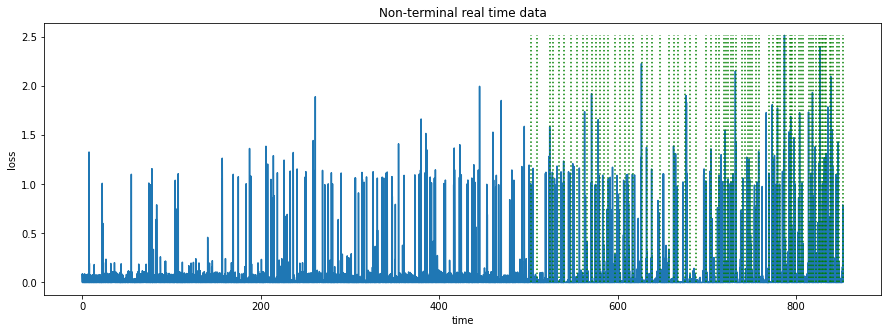

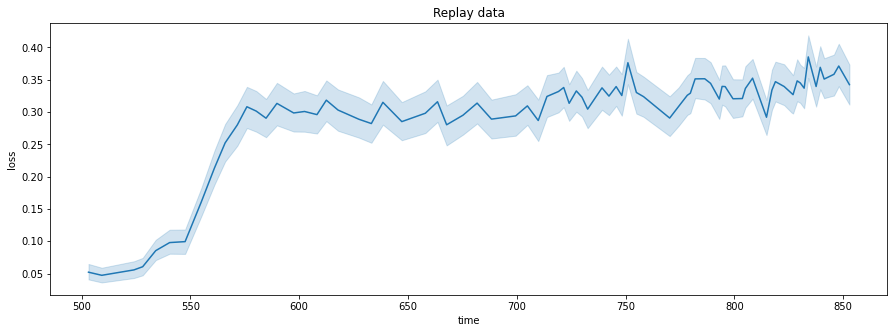

In [16]:
plt.figure(figsize=(15, 5))
sns.lineplot(x="time", y="loss", data=real_time_data)
plt.title("All real time data")
plot_replay_lines(real_time_data, "loss")
plt.show()

plt.figure(figsize=(15, 5))
terminal_data = real_time_data[real_time_data["terminal"] == True]
plt.title("Terminal real time data")
sns.lineplot(x="time", y="loss", data=terminal_data)
plot_replay_lines(terminal_data, "loss")
plt.show()

plt.figure(figsize=(15, 5))
not_terminal_data = real_time_data[real_time_data["terminal"] == False]
plt.title("Non-terminal real time data")
sns.lineplot(x="time", y="loss", data=not_terminal_data)
plot_replay_lines(not_terminal_data, "loss")
plt.show()

if len(replay_data) != 0:
    plt.figure(figsize=(15, 5))
    plt.title("Replay data")
    sns.lineplot(x="time", y="loss", data=replay_data)
    plt.show()